In [1]:
#Importing Required Libraries
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Flatten
from keras.utils import image_dataset_from_directory

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#Importing Training Data
train_data=image_dataset_from_directory(
    directory="/kaggle/input/fakereal-logo-detection/train",
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(224,224)
    )

Found 659 files belonging to 2 classes.


In [3]:
#Importing Testing Data
test_data=image_dataset_from_directory(
    directory="/kaggle/input/fakereal-logo-detection/test",
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(224,224)
    )

Found 165 files belonging to 2 classes.


In [4]:
#Importing DataVisualization Libraries
import plotly.express as px

In [5]:
#Info About Dataset
Class_Name=train_data.class_names

In [6]:
Img=[]
Label=[]
for image,label in train_data.take(1):
     for i in range(10):
            Img.append(image[i])
            Label.append(Class_Name[label[i].numpy()])

In [7]:
import matplotlib.pyplot as plt

In [8]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a 3x3 grid of subplots
fig = make_subplots(rows=3, cols=3, subplot_titles=[f"{i}" for i in Label ],horizontal_spacing=0.02)

s=0
for i in range(3):
    for j in range(3):
        # Add an image to each subplot
        fig.add_trace(go.Image(z=Img[s],dx=224,dy=224), row=i+1, col=j+1)
        s=s+1

# Hide x-axis tick labels
fig.update_xaxes(showticklabels=False)
# Hide x-axis tick labels
fig.update_yaxes(showticklabels=False)
# Show the figure
fig.update_layout(paper_bgcolor='#916048',
    title_text='Types of Potato Leaf Disease',
    title_x=0.5,  # Center the title horizontally
    title_y=0.95,height=800)  # Center the title vertically)
fig.show()

In [9]:
#Normalization
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

train_ds = train_data.map(process)
test_ds = test_data.map(process)

In [10]:
#Importing Requiried Model
from keras.applications.resnet50 import ResNet50
resnet=ResNet50(include_top=False,weights='imagenet',input_shape=(224,224,3))

94765736/94765736 [==============================] - 0s 0us/step


In [11]:
resnet.trainable=False

In [12]:
#Model Building
model=Sequential()

In [13]:
#Adding ResNet Layer
model.add(resnet)

In [14]:
#Adding Flatten Layer
model.add(Flatten())

In [15]:
#Adding Dense Layer
model.add(Dense(128,activation='relu'))
#Adding Dense Layer
model.add(Dense(64,activation='relu'))
#Adding Dense Layer
model.add(Dense(32,activation='relu'))

In [16]:
#Adding Output Layer
model.add(Dense(1,activation='sigmoid'))

In [17]:
#Model Summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 128)               12845184  
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 36443265 (139.02 MB)
Trainable params: 128

In [18]:
#Model Compilation
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [19]:
#Model Training
history=model.fit(train_ds,validation_data=test_ds,epochs=10)

Epoch 1/10
21/21 [==============================] - 12s 246ms/step - loss: 1.4628 - accuracy: 0.5690 - val_loss: 0.5512 - val_accuracy: 0.7273
Epoch 2/10
21/21 [==============================] - 3s 128ms/step - loss: 0.5284 - accuracy: 0.7284 - val_loss: 0.5239 - val_accuracy: 0.7152
Epoch 3/10
21/21 [==============================] - 3s 127ms/step - loss: 0.5170 - accuracy: 0.7329 - val_loss: 0.6123 - val_accuracy: 0.5939
Epoch 4/10
21/21 [==============================] - 3s 128ms/step - loss: 0.4667 - accuracy: 0.7678 - val_loss: 0.4664 - val_accuracy: 0.7636
Epoch 5/10
21/21 [==============================] - 3s 128ms/step - loss: 0.5022 - accuracy: 0.7436 - val_loss: 0.4639 - val_accuracy: 0.7818
Epoch 6/10
21/21 [==============================] - 3s 130ms/step - loss: 0.4916 - accuracy: 0.7451 - val_loss: 0.4793 - val_accuracy: 0.7576
Epoch 7/10
21/21 [==============================] - 3s 130ms/step - loss: 0.4281 - accuracy: 0.7815 - val_loss: 0.4509 - val_accuracy: 0.7636
Epoch

[]

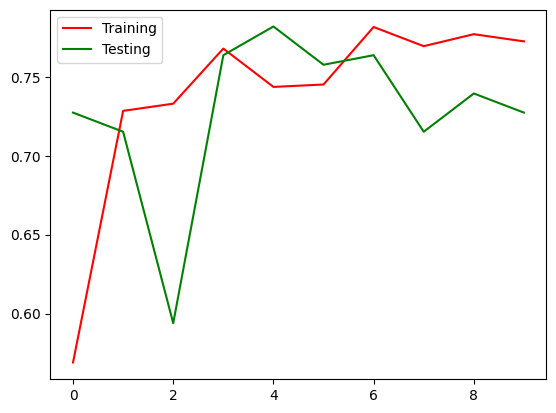

In [20]:
#Model Training Visualization
plt.plot(history.history['accuracy'],color='red',label='Training')
plt.plot(history.history['val_accuracy'],color='green',label='Testing')
plt.legend()
plt.plot()

[]

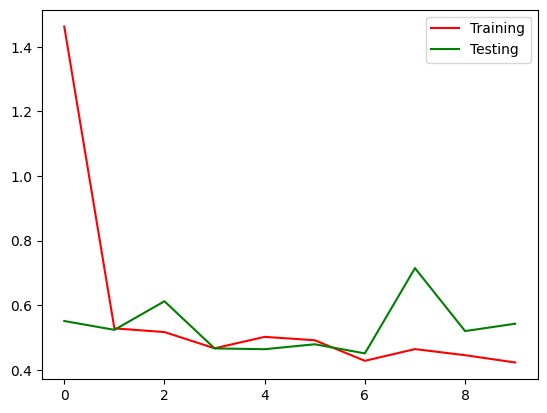

In [21]:
#Model Training Visualization
plt.plot(history.history['loss'],color='red',label='Training')
plt.plot(history.history['val_loss'],color='green',label='Testing')
plt.legend()
plt.plot()

In [22]:
#Model Evaluation
model.evaluate(test_ds)[1]*100

6/6 [==============================] - 1s 82ms/step - loss: 0.5429 - accuracy: 0.7273


72.72727489471436

In [23]:
#Model Prediction
import cv2
import numpy as np 
def predict_img(image,model):
    test_img=cv2.imread(image)
    test_img=cv2.resize(test_img,(224,224))
    test_img=np.expand_dims(test_img, axis=0)
    result=model.predict(test_img)
    print(result)
    if(result[0][0]>0.5):
        return "Fake"
    else:
        return "Genuine"

In [24]:
predict_img('/kaggle/input/fakereal-logo-detection/test/Genuine/000001_03da4775bc7540c589813d07d2a60ba7.jpg',model)

1/1 [==============================] - 2s 2s/step
[[0.8761629]]


'Fake'

In [25]:
predict_img('/kaggle/input/fakereal-logo-detection/train/Fake/000001_036396be499c46899722680ec28ddf27.jpg',model)

1/1 [==============================] - 0s 22ms/step
[[0.99703205]]


'Fake'

In [26]:
predict_img('/kaggle/input/fakereal-logo-detection/test/Genuine/000001_8eb575beae7542b2becbf7a276f780d6.jpg',model)

1/1 [==============================] - 0s 22ms/step
[[0.00591545]]


'Genuine'

In [27]:
predict_img('/kaggle/input/fakereal-logo-detection/test/Fake/000003_91055f36c8664ac798e3ae7dd86b68cc.jpg',model)

1/1 [==============================] - 0s 24ms/step
[[0.8417476]]


'Fake'

In [28]:
#Model Saving
model.save("logo_clf.keras")
model.save_weights("logo_clf_weights.h5")